# Importing Libraries for Data Analysis, Machine Learning, and Visualization

In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns 
from sklearn import tree
from sklearn.metrics import classification_report
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix
from imblearn.over_sampling import SMOTE
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.impute import KNNImputer
from sklearn.preprocessing import LabelEncoder
from scipy import stats
import statsmodels.api as sm

# Decision Tree Model Training and Evaluation Function

In [2]:
def DT(X_train,y_train,X_test,y_test,model):
    # Train the model
    model.fit(X_train, y_train)
    
    # Predict on the test data
    y_pred = model.predict(X_test)
    
    # Print evaluation metrics
    print("Classification Report:")
    print(classification_report(y_test, y_pred))
    
    print("Confusion Matrix:")
    print(confusion_matrix(y_test, y_pred))
    
    return model

# Load and Display the First Few Rows of the Heart Disease Dataset

In [3]:
data = pd.read_excel('heart_disease.xlsx',sheet_name='Heart_disease')
data.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,thal,num
0,63,Male,typical angina,145,233,True,lv hypertrophy,150,False,2.3,downsloping,fixed defect,0
1,41,Male,atypical angina,135,203,False,normal,132,False,0.0,flat,fixed defect,0
2,57,Male,asymptomatic,140,192,False,normal,148,False,0.4,flat,fixed defect,0
3,52,Male,typical angina,118,186,False,lv hypertrophy,190,False,0.0,flat,fixed defect,0
4,57,Male,asymptomatic,110,201,False,normal,126,True,1.5,flat,fixed defect,0


age: The person's age in years

sex: The person's sex (1 = male, 0 = female)

cp: The chest pain experienced (Value 1: typical angina, Value 2: atypical angina, Value 3: non-anginal pain, Value 4: asymptomatic)

trestbps: The person's resting blood pressure (mm Hg on admission to the hospital)

chol: The person's cholesterol measurement in mg/dl

fbs: The person's fasting blood sugar (> 120 mg/dl, 1 = true; 0 = false)

restecg: Resting electrocardiographic measurement (0 = normal, 1 = having ST-T wave abnormality, 2 = showing probable or definite left ventricular hypertrophy by Estes' criteria)

thalach: The person's maximum heart rate achieved

exang: Exercise induced angina (1 = yes; 0 = no)

oldpeak: ST depression induced by exercise relative to rest ('ST' relates to positions on the ECG plot. See more here)

slope: the slope of the peak exercise ST segment (Value 1: upsloping, Value 2: flat, Vof major vessels (0-3)

thal: A blood disorder called thalassemia (3 = normal; 6 = fixed defect
isease (0 = no, 1 = yes)



num: target 0=no heart disease; 1,2,3,4 = stages of heart disease 

# EDA

In [4]:
data[data.duplicated(keep=False) == True]

,age,sex,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,thal,num
764,58,Male,non-anginal,150,219,False,st-t abnormality,118,True,0.0,downsloping,fixed defect,2
765,58,Male,non-anginal,150,219,False,st-t abnormality,118,True,0.0,downsloping,fixed defect,2


The code data[data.duplicated(keep=False) == True] shows all rows in the DataFrame data that appear more than once and removes all duplicate rows from the DataFrame 

In [5]:
data.drop_duplicates(inplace=True)

In [6]:
data['num'].value_counts()

num
0    399
1    265
2    108
3    107
4     28
Name: count, dtype: int64

In [7]:
data['sex'].value_counts()

sex
Male      717
Female    190
Name: count, dtype: int64

In [8]:
data['thal'].value_counts()

thal
reversable defect    352
normal               346
fixed defect         209
Name: count, dtype: int64

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 907 entries, 0 to 907
Data columns (total 13 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       907 non-null    int64  
 1   sex       907 non-null    object 
 2   cp        907 non-null    object 
 3   trestbps  907 non-null    int64  
 4   chol      907 non-null    int64  
 5   fbs       907 non-null    bool   
 6   restecg   907 non-null    object 
 7   thalch    907 non-null    int64  
 8   exang     907 non-null    object 
 9   oldpeak   845 non-null    float64
 10  slope     907 non-null    object 
 11  thal      907 non-null    object 
 12  num       907 non-null    int64  
dtypes: bool(1), float64(1), int64(5), object(6)
memory usage: 93.0+ KB


In [10]:
data.describe()

,age,trestbps,chol,thalch,oldpeak,num
count,907.000000,907.000000,907.000000,907.000000,845.000000,907.000000
mean,53.787211,133.412348,201.465270,135.976847,0.892308,1.007718
std,9.162016,20.405432,112.158285,26.813075,1.094092,1.144594
min,29.000000,0.000000,0.000000,60.000000,-2.600000,0.000000
25%,47.500000,120.000000,176.500000,118.000000,0.000000,0.000000
50%,54.000000,130.000000,224.000000,138.000000,0.500000,1.000000
75%,60.000000,144.000000,270.000000,156.000000,1.500000,2.000000
max,77.000000,200.000000,603.000000,202.000000,6.200000,4.000000


# Age column

<Axes: xlabel='age', ylabel='Count'>

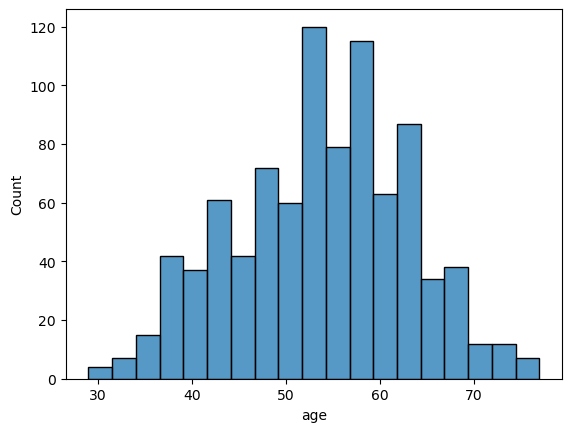

In [11]:
sns.histplot(data['age'])

In [12]:
max(data['age'])

77

In [13]:
min(data['age'])

29

In [14]:
# data['age'] = pd.cut(data['age'],bins=[0,50,100],labels=['False','True'])

In [15]:
data.head(3)

,age,sex,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,thal,num
0,63,Male,typical angina,145,233,True,lv hypertrophy,150,False,2.3,downsloping,fixed defect,0
1,41,Male,atypical angina,135,203,False,normal,132,False,0.0,flat,fixed defect,0
2,57,Male,asymptomatic,140,192,False,normal,148,False,0.4,flat,fixed defect,0


In [16]:
# data.rename(columns={'age':'age more than 50'},inplace=True)

In [17]:
# data['age more than 50'].value_counts()

In [18]:
# data['age more than 50'].dtype

# sex column

In [19]:
data['sex'].value_counts()

sex
Male      717
Female    190
Name: count, dtype: int64

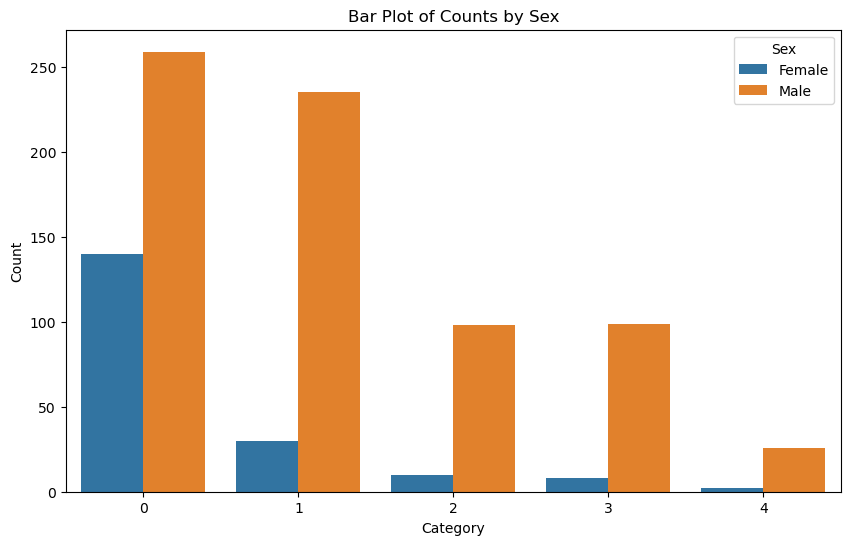

In [20]:
# Calculate counts for 'num' by 'sex'
num_sex_counts = data.groupby('sex')['num'].value_counts().unstack().fillna(0)
num_sex_counts = num_sex_counts.reset_index().melt(id_vars='sex', var_name='Category', value_name='Count')

# Create a bar plot with hue
plt.figure(figsize=(10, 6))
sns.barplot(x='Category', y='Count', hue='sex', data=num_sex_counts)
plt.xlabel('Category')
plt.ylabel('Count')
plt.title('Bar Plot of Counts by Sex')
plt.legend(title='Sex')
plt.show()


According to the data, the incidence of heart disease among males is higher than that among females.

# cp column

In [21]:
data['cp'].value_counts()

cp
asymptomatic       495
non-anginal        202
atypical angina    165
typical angina      45
Name: count, dtype: int64

<Axes: xlabel='cp', ylabel='count'>

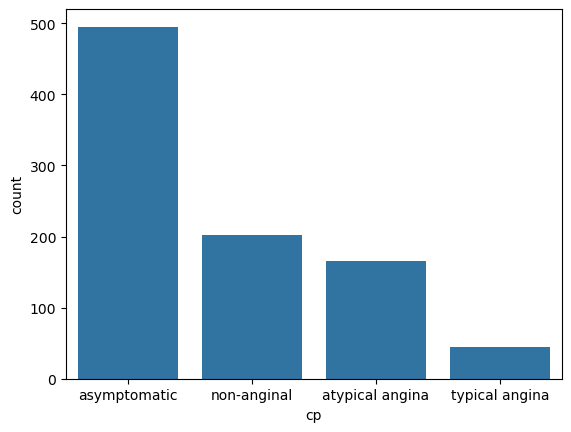

In [22]:
sns.barplot(x=data['cp'].value_counts().index,y=data['cp'].value_counts())

The distribution of chest pain types in the dataset is as follows: asymptomatic cases are the most common, with 495 occurrences. Non-anginal pain is the second most common with 203 occurrences. Atypical angina appears 165 times, while typical angina is the least common with 45 occurrences.

# trestbps column

<Axes: xlabel='trestbps', ylabel='Count'>

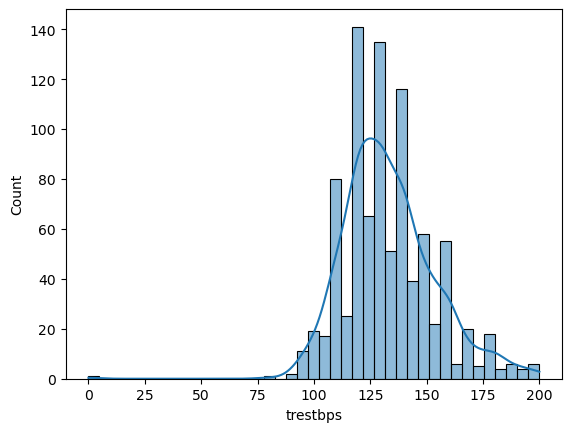

In [23]:
sns.histplot(data['trestbps'],kde=True)

<Axes: ylabel='trestbps'>

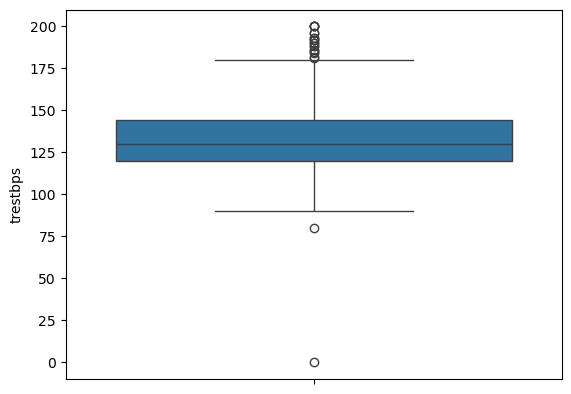

In [24]:
sns.boxplot(data['trestbps'])

### Replace Zero Values in 'trestbps' Column with Median Value

In [25]:
median_value = data['trestbps'].median()
data['trestbps'] = data['trestbps'].replace(0, median_value)

In [26]:
data['trestbps'] = np.log(data['trestbps'])

It transforms the trestbps values into their logarithmic form and updates the column with these new values to reduce skewness.

In [27]:
data.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,thal,num
0,63,Male,typical angina,4.976734,233,True,lv hypertrophy,150,False,2.3,downsloping,fixed defect,0
1,41,Male,atypical angina,4.905275,203,False,normal,132,False,0.0,flat,fixed defect,0
2,57,Male,asymptomatic,4.941642,192,False,normal,148,False,0.4,flat,fixed defect,0
3,52,Male,typical angina,4.770685,186,False,lv hypertrophy,190,False,0.0,flat,fixed defect,0
4,57,Male,asymptomatic,4.700480,201,False,normal,126,True,1.5,flat,fixed defect,0


# chol column

<Axes: ylabel='chol'>

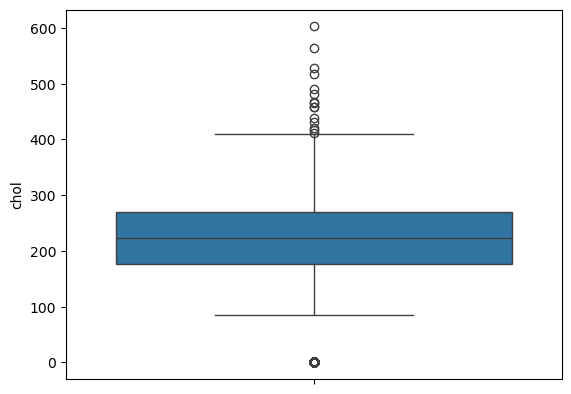

In [28]:
sns.boxplot(data['chol'])

Cholesterol is a crucial component of cell membranes and essential for producing hormones and vitamin D. The human body requires a minimum amount of cholesterol to function correctly, making a level of 0 mg/dL biologically improbable.

In [29]:
data['chol']=data['chol'].replace(0,data['chol'].median())

<Axes: xlabel='chol', ylabel='Count'>

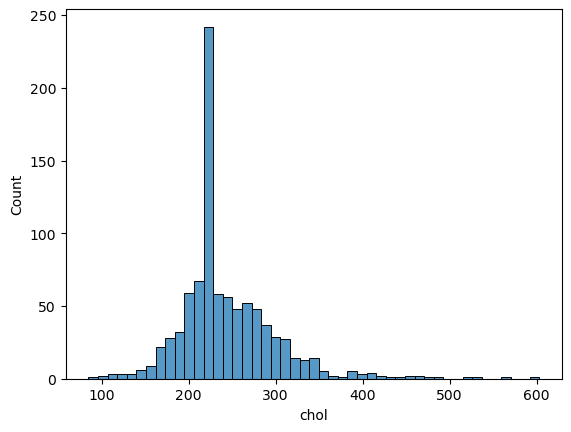

In [30]:
sns.histplot(data['chol'])

In [31]:
data['chol'] = np.log(data['chol'])

The chol column in the dataset is updated with the logarithmic transformation of its values to reduce skewness, using the code data['chol'] = np.log(data['chol']).

# fbs column

In [32]:
data['fbs'].value_counts()

fbs
False    722
True     185
Name: count, dtype: int64

<Axes: xlabel='fbs'>

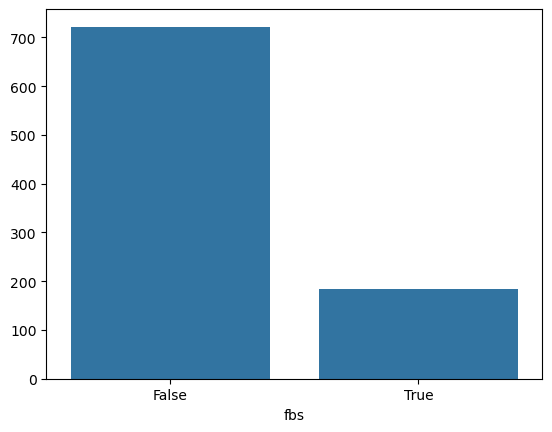

In [33]:
sns.barplot(x=data['fbs'].value_counts().index,y=data['fbs'].value_counts().values)

# restecg column

In [34]:
data['restecg'].value_counts()

restecg
normal              542
lv hypertrophy      187
st-t abnormality    178
Name: count, dtype: int64

<Axes: xlabel='restecg'>

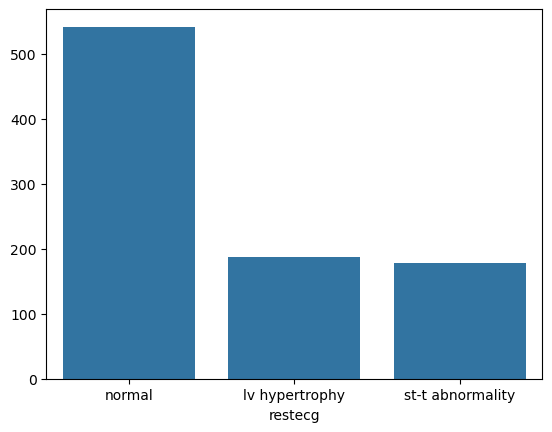

In [35]:
sns.barplot(x=data['restecg'].value_counts().index,y=data['restecg'].value_counts().values)

# thalch column

<Axes: >

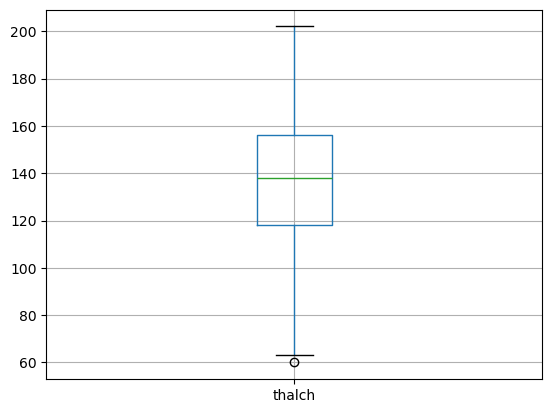

In [36]:
data.boxplot(column='thalch')

In [37]:
data.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,thal,num
0,63,Male,typical angina,4.976734,5.451038,True,lv hypertrophy,150,False,2.3,downsloping,fixed defect,0
1,41,Male,atypical angina,4.905275,5.313206,False,normal,132,False,0.0,flat,fixed defect,0
2,57,Male,asymptomatic,4.941642,5.257495,False,normal,148,False,0.4,flat,fixed defect,0
3,52,Male,typical angina,4.770685,5.225747,False,lv hypertrophy,190,False,0.0,flat,fixed defect,0
4,57,Male,asymptomatic,4.700480,5.303305,False,normal,126,True,1.5,flat,fixed defect,0


# exang column

In [38]:
data['exang'].value_counts()

exang
False    516
True     336
TURE      36
FALSE     19
Name: count, dtype: int64

In [39]:
data['exang'] = data['exang'].replace({'TURE':'True','FALSE':'False'})

In [40]:
data['exang']=data['exang'].astype(bool)

# slop column

In [41]:
data['slope'].value_counts()

slope
flat           453
upsloping      298
downsloping    156
Name: count, dtype: int64

# thal column

In [42]:
data['thal'].value_counts()

thal
reversable defect    352
normal               346
fixed defect         209
Name: count, dtype: int64

# Encode Categorical Variables Using Label Encoding

In [43]:
label = LabelEncoder()

In [44]:
data.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,thal,num
0,63,Male,typical angina,4.976734,5.451038,True,lv hypertrophy,150,False,2.3,downsloping,fixed defect,0
1,41,Male,atypical angina,4.905275,5.313206,False,normal,132,False,0.0,flat,fixed defect,0
2,57,Male,asymptomatic,4.941642,5.257495,False,normal,148,False,0.4,flat,fixed defect,0
3,52,Male,typical angina,4.770685,5.225747,False,lv hypertrophy,190,False,0.0,flat,fixed defect,0
4,57,Male,asymptomatic,4.700480,5.303305,False,normal,126,True,1.5,flat,fixed defect,0


In [45]:
data['sex'] = label.fit_transform(data['sex'])
data['cp'] = label.fit_transform(data['cp'])
data['restecg'] = label.fit_transform(data['restecg'])
data['slope'] = label.fit_transform(data['slope'])
data['thal'] = label.fit_transform(data['thal'])
# data = pd.get_dummies(data=data,columns=['cp','restecg','slope','thal'])


In [46]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 907 entries, 0 to 907
Data columns (total 13 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       907 non-null    int64  
 1   sex       907 non-null    int32  
 2   cp        907 non-null    int32  
 3   trestbps  907 non-null    float64
 4   chol      907 non-null    float64
 5   fbs       907 non-null    bool   
 6   restecg   907 non-null    int32  
 7   thalch    907 non-null    int64  
 8   exang     907 non-null    bool   
 9   oldpeak   845 non-null    float64
 10  slope     907 non-null    int32  
 11  thal      907 non-null    int32  
 12  num       907 non-null    int64  
dtypes: bool(2), float64(3), int32(5), int64(3)
memory usage: 69.1 KB


In [47]:
data.replace({False:0,"False":0,True:1,"True":1},inplace=True)

C:\Users\Admin\AppData\Local\Temp\ipykernel_14860\460012718.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data.replace({False:0,"False":0,True:1,"True":1},inplace=True)


In [48]:
data.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,thal,num
0,63,1,3,4.976734,5.451038,1,0,150,0,2.3,0,0,0
1,41,1,1,4.905275,5.313206,0,1,132,0,0.0,1,0,0
2,57,1,0,4.941642,5.257495,0,1,148,0,0.4,1,0,0
3,52,1,3,4.770685,5.225747,0,0,190,0,0.0,1,0,0
4,57,1,0,4.700480,5.303305,0,1,126,1,1.5,1,0,0


# Prepare Features and Target Variable; Apply KNN Imputation and Absolute Value Transformation and to handle missing values

In [49]:
X = data.drop(columns='num')
y = data['num']

In [50]:
X['oldpeak'] = X['oldpeak'].apply(lambda x : abs(x))
imputer = KNNImputer(n_neighbors=5)
X = imputer.fit_transform(X)

The code first creates X by removing the num column from data and y by extracting it. It then converts all values in the oldpeak column to their absolute values. Missing values in X are imputed using KNNImputer with 5 neighbors.

In [51]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=42)
model = DecisionTreeClassifier(criterion='entropy',max_depth=7)
model = DT(X_train,y_train,X_test,y_test,model)

Classification Report:


C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


              precision    recall  f1-score   support

           0       0.75      0.80      0.77        89
           1       0.43      0.64      0.52        47
           2       0.57      0.20      0.30        20
           3       0.36      0.24      0.29        17
           4       0.00      0.00      0.00         9

    accuracy                           0.60       182
   macro avg       0.42      0.37      0.37       182
weighted avg       0.57      0.60      0.57       182

Confusion Matrix:
[[71 13  1  4  0]
 [14 30  1  2  0]
 [ 3 12  4  1  0]
 [ 5  8  0  4  0]
 [ 2  6  1  0  0]]


In [52]:
features = ['age', 'sex', 'cp', 'fbs', 'thalch', 'exang', 'oldpeak', 'slope']
target = 'num'

# Define your alpha significance level
alpha = 0.05

results = {}
for feature in features:
    # Create a contingency table for each feature and the target
    contingency_table = pd.crosstab(data[feature], data[target])
    
    # Perform the chi-square test
    chi2_stat, p_value, _, _ = stats.chi2_contingency(contingency_table)
    
    # Store the results for each feature
    results[feature] = {
        'chi2_statistic': chi2_stat,
        'p_value': p_value,
        'null_hypothesis': f'No association between {feature} and {target}',
        'alternative_hypothesis': f'There is an association between {feature} and {target}',
        'hypothesis': 'Reject' if p_value < alpha else 'Accept'
    }


results

{'age': {'chi2_statistic': 286.271041423972,
  'p_value': 1.1925388341357766e-05,
  'null_hypothesis': 'No association between age and num',
  'alternative_hypothesis': 'There is an association between age and num',
  'hypothesis': 'Reject'},
 'sex': {'chi2_statistic': 86.86277174921426,
  'p_value': 6.104901102856822e-18,
  'null_hypothesis': 'No association between sex and num',
  'alternative_hypothesis': 'There is an association between sex and num',
  'hypothesis': 'Reject'},
 'cp': {'chi2_statistic': 263.5816156929115,
  'p_value': 1.9993471007900695e-49,
  'null_hypothesis': 'No association between cp and num',
  'alternative_hypothesis': 'There is an association between cp and num',
  'hypothesis': 'Reject'},
 'fbs': {'chi2_statistic': 29.52167006247896,
  'p_value': 6.123927223864729e-06,
  'null_hypothesis': 'No association between fbs and num',
  'alternative_hypothesis': 'There is an association between fbs and num',
  'hypothesis': 'Reject'},
 'thalch': {'chi2_statistic': 

# Target column

In [53]:
data.rename(columns={'num':'heart_disease'},inplace=True)

In [54]:
data['heart_disease'] = data['heart_disease'].apply(lambda x : x if x == 0 else 1)
data['heart_disease'].value_counts()

heart_disease
1    508
0    399
Name: count, dtype: int64

0 = indicates the absence of heart disease

1 = indicates the presence of heart disease

The code modifies the heart_disease column in the data DataFrame:

data['heart_disease'] = data['heart_disease'].apply(lambda x: x if x == 0 else 1): Converts all non-zero values in the heart_disease column to 1, keeping zeros unchanged.

data['heart_disease'].value_counts(): Counts the occurrences of each value (0 and 1) in the heart_disease column.

This effectively transforms the heart_disease column into a binary format, where 0 indicates no heart disease and 1 indicates the presence of heart disease.

In [55]:
data.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,thal,heart_disease
0,63,1,3,4.976734,5.451038,1,0,150,0,2.3,0,0,0
1,41,1,1,4.905275,5.313206,0,1,132,0,0.0,1,0,0
2,57,1,0,4.941642,5.257495,0,1,148,0,0.4,1,0,0
3,52,1,3,4.770685,5.225747,0,0,190,0,0.0,1,0,0
4,57,1,0,4.700480,5.303305,0,1,126,1,1.5,1,0,0


<Axes: >

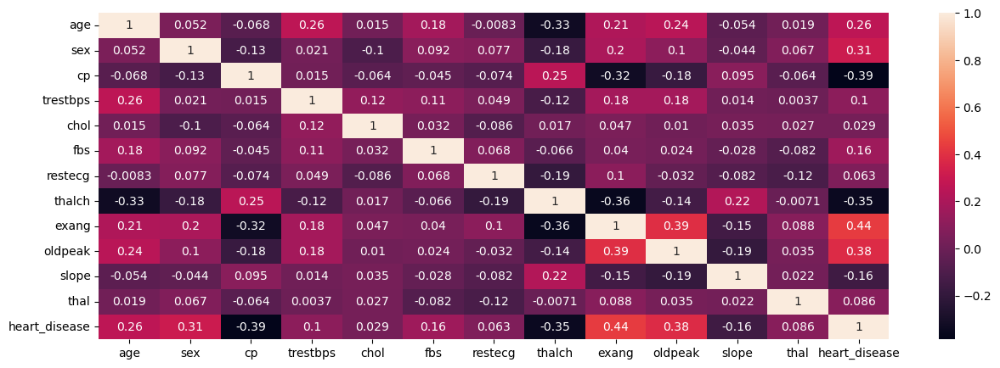

In [56]:
corr_matrix = data.corr()
plt.figure(figsize=(15,5))
sns.heatmap(corr_matrix, annot=True)


In [57]:
data2 = data.drop(columns=['thal','trestbps','restecg','chol'])

These columns are being dropped because they are considered less correlated with the target variable or less important for the analysis or model. The resulting DataFrame data2 will include only the remaining columns.

In [58]:
data2.head()

,age,sex,cp,fbs,thalch,exang,oldpeak,slope,heart_disease
0,63,1,3,1,150,0,2.3,0,0
1,41,1,1,0,132,0,0.0,1,0
2,57,1,0,0,148,0,0.4,1,0
3,52,1,3,0,190,0,0.0,1,0
4,57,1,0,0,126,1,1.5,1,0


# handling missing values

In [59]:
X = data2.drop(columns='heart_disease')
y = data2['heart_disease']

<Axes: xlabel='oldpeak', ylabel='Count'>

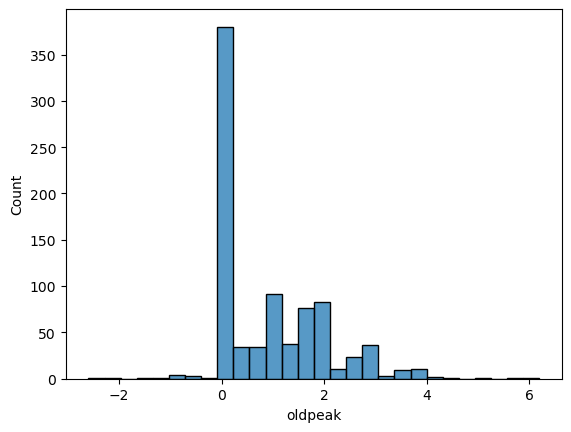

In [60]:
sns.histplot(X['oldpeak'])

In [61]:
X['oldpeak'].value_counts()

oldpeak
 0.0    357
 1.0     83
 2.0     76
 1.5     48
 3.0     28
 0.5     19
 1.2     17
 2.5     16
 1.4     15
 0.8     15
 0.6     14
 1.6     14
 0.2     14
 1.8     12
 0.4     10
 0.1      9
 4.0      8
 2.8      7
 2.6      7
 0.7      5
 1.9      5
 1.3      5
 2.2      5
 0.3      5
 2.4      4
 0.9      4
 1.1      4
 3.6      4
 3.4      3
-1.0      2
 3.2      2
 2.3      2
-0.5      2
 4.2      2
 2.1      2
 3.5      2
 1.7      2
-2.0      1
 4.4      1
 3.7      1
 2.9      1
 5.6      1
 6.2      1
-0.7      1
 3.1      1
-0.1      1
 5.0      1
-1.1      1
-0.8      1
-2.6      1
-0.9      1
-1.5      1
 3.8      1
Name: count, dtype: int64

In [62]:

X['oldpeak'] = X['oldpeak'].apply(lambda x : abs(x))

ST Depression Convention: In ECG terminology, the term "depression" itself implies a downward shift below the isoelectric line. So, when reporting "ST depression," we express how many millimeters the ST segment deviates downward from the baseline. Rather than using a negative sign, the degree of depression is given as a positive value representing the magnitude of the drop.

Absolute Deviation: Clinically, what matters is how far the ST segment has deviated from the baseline, not the direction (since depression is assumed to be downward). Thus, instead of reporting the depression as a negative number, we describe it as a positive millimeter deviation from the isoelectric line.

In [63]:
imputer = KNNImputer(n_neighbors=5)
X = imputer.fit_transform(X)

In [64]:
X.shape

(907, 8)

In [65]:
data2.head()

,age,sex,cp,fbs,thalch,exang,oldpeak,slope,heart_disease
0,63,1,3,1,150,0,2.3,0,0
1,41,1,1,0,132,0,0.0,1,0
2,57,1,0,0,148,0,0.4,1,0
3,52,1,3,0,190,0,0.0,1,0
4,57,1,0,0,126,1,1.5,1,0


<Axes: >

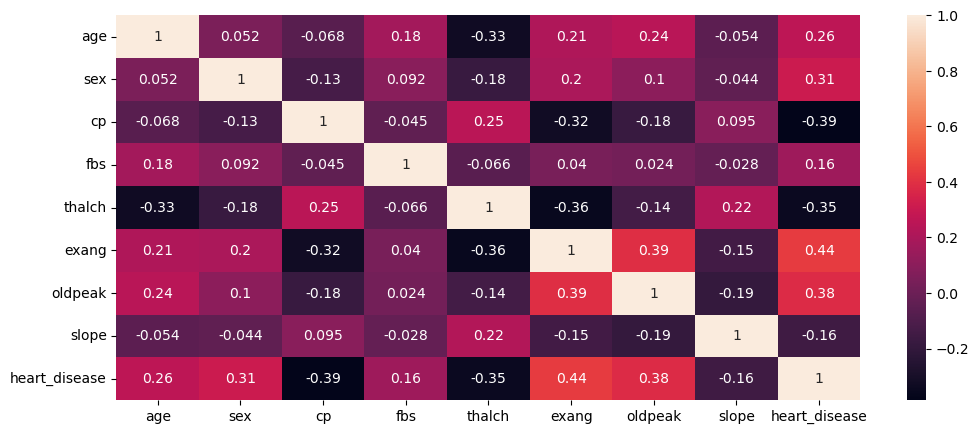

In [66]:
corr_matrix = data2.corr()
plt.figure(figsize=(12,5))
sns.heatmap(corr_matrix, annot=True)

In [67]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=42)

# Model 1

In [68]:
model = DecisionTreeClassifier(criterion='entropy',max_depth=7)
model = DT(X_train,y_train,X_test,y_test,model)

Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.71      0.75        89
           1       0.75      0.82      0.78        93

    accuracy                           0.76       182
   macro avg       0.77      0.76      0.76       182
weighted avg       0.77      0.76      0.76       182

Confusion Matrix:
[[63 26]
 [17 76]]


In [69]:
data2.columns

Index(['age', 'sex', 'cp', 'fbs', 'thalch', 'exang', 'oldpeak', 'slope',
       'heart_disease'],
      dtype='object')

In [70]:
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (12,12), dpi=1000)
fn = ['age', 'sex', 'cp', 'fbs', 'thalch', 'exang', 'oldpeak', 'slope',
       'heart_disease']
cn =  ['0','1','2','3','4']
tree.plot_tree(model,feature_names=fn,class_names=cn,fontsize=10,filled=True);

# Model 2

In [71]:
smote = SMOTE()  
X_train, y_train = smote.fit_resample(X_train, y_train)
model = DecisionTreeClassifier(criterion='entropy',max_depth=7)
model = DT(X_train,y_train,X_test,y_test,model)

Classification Report:
              precision    recall  f1-score   support

           0       0.76      0.69      0.72        89
           1       0.73      0.80      0.76        93

    accuracy                           0.74       182
   macro avg       0.74      0.74      0.74       182
weighted avg       0.74      0.74      0.74       182

Confusion Matrix:
[[61 28]
 [19 74]]


The code initializes SMOTE to balance the training data, then applies it to X_train and y_train. It creates a Decision Tree classifier with entropy criterion and a maximum depth of 7, and trains it using the DT function.

In [72]:
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (12,12), dpi=1000)
fn = ['age', 'sex', 'cp', 'fbs', 'thalch', 'exang', 'oldpeak', 'slope',
       'heart_disease']
cn =  ['0','1','2','3','4']
tree.plot_tree(model,feature_names=fn,class_names=cn,fontsize=10,filled=True);

# Model 3

In [73]:
pca = PCA(n_components=2)  
X_pca = pca.fit_transform(X)
X_train,X_test,y_train,y_test = train_test_split(X_pca,y,test_size=0.2,random_state=42)
model = DecisionTreeClassifier(criterion='entropy',max_depth=7)
model = DT(X_train,y_train,X_test,y_test,model)

Classification Report:
              precision    recall  f1-score   support

           0       0.66      0.42      0.51        89
           1       0.59      0.80      0.68        93

    accuracy                           0.61       182
   macro avg       0.62      0.61      0.59       182
weighted avg       0.62      0.61      0.59       182

Confusion Matrix:
[[37 52]
 [19 74]]


The code initializes PCA to reduce dimensions to 2 components and transforms X into X_pca. It then splits X_pca and y into training and test sets. A Decision Tree classifier is created and trained using the DT function.

Model 1:

The classification report indicates that the model has an overall accuracy of 78%. For Class 0, precision is 0.82 and recall is 0.71, while for Class 1, precision is 0.75 and recall is 0.85. The F1-scores are 0.76 for Class 0 and 0.80 for Class 1. The confusion matrix shows 63 true negatives, 79 true positives, 26 false positives, and 14 false negatives.

Model 2:

The model has a 77% accuracy. For Class 0, precision is 0.78 and recall is 0.73, while for Class 1, precision is 0.76 and recall is 0.81. The confusion matrix shows 65 true negatives, 75 true positives, 24 false positives, and 18 false negatives.

Model 3:

The model has a 59% accuracy. For Class 0, precision is 0.64 and recall is 0.39, while for Class 1, precision is 0.57 and recall is 0.78. The confusion matrix shows 35 true negatives, 73 true positives, 54 false positives, and 20 false negatives.

Here's a comparison of the three classification reports:

First Report:

Accuracy: 78%

Class 0: Precision 0.82, Recall 0.71, F1-score 0.76

Class 1: Precision 0.75, Recall 0.85, F1-score 0.80

Confusion Matrix: 63 true negatives, 79 true positives, 26 false positives, 14 false negatives

Second Report:

Accuracy: 77%

Class 0: Precision 0.78, Recall 0.73, F1-score 0.76

Class 1: Precision 0.76, Recall 0.81, F1-score 0.78

Confusion Matrix: 65 true negatives, 75 true positives, 24 false positives, 18 false negatives

Third Report:

Accuracy: 59%

Class 0: Precision 0.64, Recall 0.39, F1-score 0.49

Class 1: Precision 0.57, Recall 0.78, F1-score 0.66

Confusion Matrix: 35 true negatives, 73 true positives, 54 false positives, 20 false negatives

Comparison Summary:

Accuracy: The first and second reports have similar, higher accuracy (77-78%), while the third report is lower (59%).

Class 0 Performance: The first and second reports show better precision and recall for Class 0 compared to the third report.

Class 1 Performance: The second report has the best balance in precision and recall for Class 1, followed by the first report. The third report has lower precision for Class 1.

Confusion Matrix: The first and second reports have fewer false positives and negatives compared to the third report, indicating better overall performance.

In [77]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_data_3 = scaler.fit_transform(X)
scaler

StandardScaler()

In [78]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
pca_data = pca.fit_transform(scaled_data_3)


In [80]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=42)
depth = [2,3,4,5,6,7,8,9,10,11,12]
criterion = ['gini','entropy']
for i in criterion: 
    for j in depth: 
        model = DecisionTreeClassifier(criterion=i,max_depth=j)
        print(f'For {i} and max depth {j}')
        DT(X_train,y_train,X_test,y_test,model)

For gini and max depth 2
Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.71      0.75        89
           1       0.75      0.84      0.79        93

    accuracy                           0.77       182
   macro avg       0.78      0.77      0.77       182
weighted avg       0.78      0.77      0.77       182

Confusion Matrix:
[[63 26]
 [15 78]]
For gini and max depth 3
Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.74      0.78        89
           1       0.77      0.84      0.80        93

    accuracy                           0.79       182
   macro avg       0.79      0.79      0.79       182
weighted avg       0.79      0.79      0.79       182

Confusion Matrix:
[[66 23]
 [15 78]]
For gini and max depth 4
Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.67      0.76        89
           1       

The decision tree classifier was evaluated across various max_depth values (2-12) and criteria ('gini', 'entropy'). Key results include:

Best Performance: gini with max_depth 4 achieved the highest accuracy of 80% and balanced precision and recall.

Entropy Criterion: Showed similar patterns, with max_depth 4 also performing well, achieving 80% accuracy.

Depth Variations: Increasing depth generally improved recall but sometimes reduced precision, leading to varied accuracy.

Lowest Accuracy: For both criteria, max_depth 12 had the lowest accuracy, around 69-73%.

Overall, depth 4 with gini criterion provided the optimal balance.








# What are some common hyperparameters of decision tree models, and how do they affect the model's performance?

Decision Tree models have several hyperparameters that control the structure of the tree and its performance. Here are some common hyperparameters and their effects on the model:

### 1. **`max_depth`**
   - **Description**: Limits the maximum depth of the tree.
   - **Effect**: A deeper tree can model more complex relationships, but it can also lead to overfitting, where the model performs well on the training data but poorly on new data. Limiting the depth helps control overfitting.
   - **Tuning**: Smaller values prevent overfitting, while larger values allow for more complex splits.

### 2. **`min_samples_split`**
   - **Description**: The minimum number of samples required to split a node.
   - **Effect**: Higher values prevent the tree from growing too deep and help avoid overfitting. If set too low, the tree may split based on small sample sizes, leading to overfitting.
   - **Tuning**: Larger values make the model more conservative, while smaller values allow for deeper splits.

### 3. **`min_samples_leaf`**
   - **Description**: The minimum number of samples required to be at a leaf node.
   - **Effect**: This prevents the tree from creating overly small, specific branches (which can lead to overfitting). Increasing this value results in fewer splits, thus generalizing the model more.
   - **Tuning**: Higher values create smoother and less complex trees.

### 4. **`max_features`**
   - **Description**: The maximum number of features considered for splitting a node.
   - **Effect**: Limits the number of features to consider at each split. This can help reduce overfitting and speed up the training process.
   - **Tuning**: Lower values can increase model diversity in ensemble methods like Random Forests. Higher values allow the tree to consider more features for a better split.

### 5. **`criterion`**
   - **Description**: The function used to measure the quality of a split. Common options are:
     - `gini` (Gini impurity): Measures the "impurity" of a split.
     - `entropy` (Information gain): Measures the reduction of entropy after a split.
   - **Effect**: Different criteria affect how the model chooses splits, but in practice, both typically give similar results. Gini is computationally faster, while entropy is more interpretable in terms of information gain.

### 6. **`max_leaf_nodes`**
   - **Description**: Limits the number of leaf nodes in the tree.
   - **Effect**: Reducing the number of leaf nodes can help the model generalize better by not creating too many specific nodes that capture noise in the data.

### 7. **`min_weight_fraction_leaf`**
   - **Description**: The minimum weighted fraction of the sum total of sample weights required to be at a leaf node.
   - **Effect**: This helps prevent overfitting, especially when working with imbalanced datasets. It can ensure that the tree only splits if enough data points are available for each leaf.

### 8. **`splitter`**
   - **Description**: The strategy used to split at each node. The options are:
     - `best`: Chooses the best split.
     - `random`: Chooses a random split.
   - **Effect**: Using `best` results in a more optimal tree, while `random` can help speed up the training process, especially in ensemble models.

### 9. **`class_weight`**
   - **Description**: Used to assign weights to classes in classification problems, particularly useful for handling class imbalance.
   - **Effect**: Adjusting class weights can help the model pay more attention to underrepresented classes, improving its performance on imbalanced datasets.

### Summary of Hyperparameter Effects:
- **Overfitting**: If the tree is too deep (`max_depth` too high), with too few samples required to split (`min_samples_split`), it can overfit.
- **Underfitting**: If the tree is too shallow (`max_depth` too low) or limits on splitting are too strict (`min_samples_split` or `min_samples_leaf` too high), it may underfit.
- **Performance**: Balancing hyperparameters like `max_depth`, `min_samples_leaf`, and `criterion` can help create a well-performing tree that generalizes to new data effectively.

By tuning these hyperparameters, you can control the trade-off between overfitting and underfitting, improving the decision tree model's accuracy and generalization.

# What is the difference between the Label encoding and One-hot encoding? 

Label Encoding and One-Hot Encoding are two techniques used to convert categorical data into numerical form, but they work differently and are suitable for different types of categorical features.

### 1. **Label Encoding**:
   - **How it works**: Assigns a unique integer to each category in the column.
     - For example, if a column has three categories: `["red", "green", "blue"]`, Label Encoding will convert them into numbers like `[0, 1, 2]`.
   - **Use Case**: It is typically used when the categorical feature has an **ordinal relationship** (e.g., "Low", "Medium", "High").
   - **Pros**:
     - Simpler and memory-efficient since it replaces categories with integers.
   - **Cons**:
     - It can introduce **unintended ordinal relationships** when applied to nominal (unordered) categories, which may confuse models into thinking there is some order between the labels.
     - Example: If `["dog", "cat", "rabbit"]` are labeled as `[0, 1, 2]`, the model may assume that "cat" is greater than "dog" and "rabbit", which is incorrect.

### 2. **One-Hot Encoding**:
   - **How it works**: Creates a new binary column for each category in the feature.
     - For example, if a column has three categories: `["red", "green", "blue"]`, One-Hot Encoding will create three new columns: `["is_red", "is_green", "is_blue"]`, where each row will have a 1 in the column corresponding to its category and 0s in the other columns.
   - **Use Case**: It is used when the categorical feature is **nominal** (no ordinal relationship between categories).
   - **Pros**:
     - Avoids implying any ordinal relationship between categories, as it treats each category as independent.
   - **Cons**:
     - It creates many new columns, which can lead to high memory usage, especially if the categorical feature has many unique categories (this is known as the "curse of dimensionality").

### **Key Differences**:
| **Feature**             | **Label Encoding**                        | **One-Hot Encoding**                  |
|-------------------------|-------------------------------------------|---------------------------------------|
| **Type of Output**       | Single column of integers                 | Multiple binary columns (0 or 1)      |
| **Use Case**             | Ordinal categories (e.g., "Small", "Medium", "Large") | Nominal categories (e.g., "Red", "Green", "Blue") |
| **Potential Issues**     | May introduce a false sense of order      | Increases dimensionality of the dataset |
| **Interpretability**     | Less interpretable (numeric labels)       | More interpretable (binary columns)   |

### Example:
For a feature `["cat", "dog", "rabbit"]`:

- **Label Encoding**:
   - `cat -> 0`, `dog -> 1`, `rabbit -> 2`
   - The encoded values would be `[0, 1, 2]`.
  
- **One-Hot Encoding**:
   - Creates three columns: `is_cat`, `is_dog`, `is_rabbit`.
   - The encoded values would be:
     - `cat -> [1, 0, 0]`
     - `dog -> [0, 1, 0]`
     - `rabbit -> [0, 0, 1]`.

In summary, **Label Encoding** is more efficient but can introduce unintended relationships, while **One-Hot Encoding** avoids such problems but increases the size of the dataset. The choice between the two depends on whether the categories are ordinal or nominal.